In [1]:
import h5py
import os
from PIL import Image
import numpy as np

# Load the .h5 file
with h5py.File('Galaxy10_DECals.h5', 'r') as h5f:
    images = h5f['images'][:]  # Assuming dataset is stored under 'images'
    labels = h5f['ans'][:]  # Assuming labels are stored under 'labels'

# Specify the root directory for the dataset
root_dir = 'dataset'  # Relative path to avoid any permission issues
os.makedirs(root_dir, exist_ok=True)  # Create the root dataset directory

# Loop through the images and labels to save them
for idx, (img, label) in enumerate(zip(images, labels)):
    class_dir = os.path.join(root_dir, str(label))  # Convert label to string if needed
    os.makedirs(class_dir, exist_ok=True)
    
    img_path = os.path.join(class_dir, f'image_{idx}.png')
    
    # Convert the image to uint8 and save using PIL
    img = Image.fromarray(np.uint8(img))
    img.save(img_path)
    

print("Dataset folders created successfully.")


: 

In [1]:
import os

# Specify the folder path you want to create
folder_path = 'dataset'

# Create the folder if it doesn't exist
os.makedirs(folder_path, exist_ok=True)

# Make sure the folder is writable
os.chmod(folder_path, 0o777)  # Gives read, write, and execute permissions to everyone


In [3]:
import h5py
import os
from PIL import Image
import numpy as np
import cv2

import cv2
import numpy as np
import random
import matplotlib.pyplot as plt


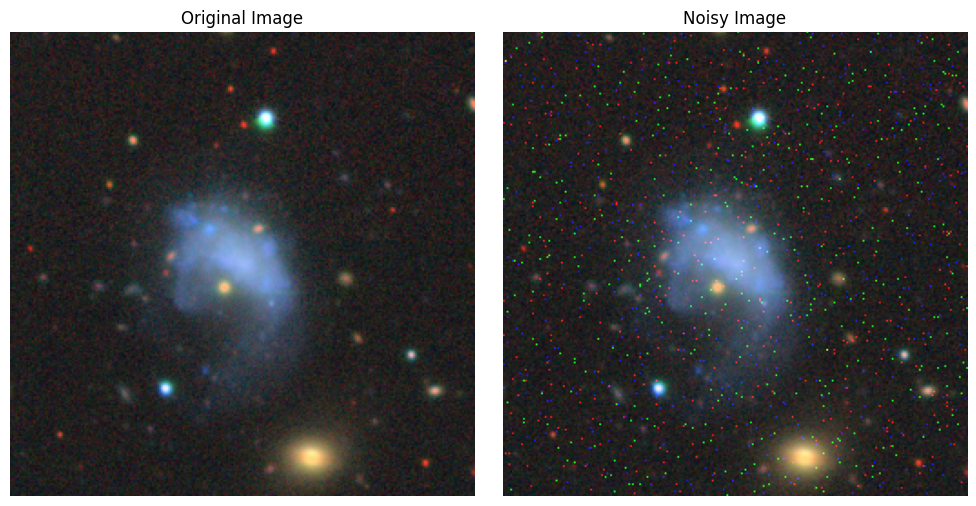

In [ ]:

def add_random_spots(image, num_spots=10):
    h, w, _ = image.shape
    for _ in range(num_spots):
        # Random position
        x, y = random.randint(0, w-1), random.randint(0, h-1)
        
        # Random size and color
        size = random.randint(1, 2)  # Random size for the spot
        color = random.choices([(255, 255, 255), (0, 0, 255), (255, 0, 0)], weights=(2, 1, 1))[0]  # 2:1:1 ratio
        
        # Create a spot
        cv2.circle(image, (x, y), size, color, -1)
        
        # Optional: Apply Gaussian blur to the spot
        spot_roi = image[max(0, y-size):min(h, y+size), max(0, x-size):min(w, x+size)]
        blurred_spot = cv2.GaussianBlur(spot_roi, (5, 5), 0)
        image[max(0, y-size):min(h, y+size), max(0, x-size):min(w, x+size)] = blurred_spot
        
        # Blend the spot with the original image using alpha
        alpha = 0.3  # Transparency factor (0.0 to 1.0)
        cv2.addWeighted(image, alpha, image, 1 - alpha, 0, image)
        
    return image

def add_gaussian_noise(image, mean=0, sigma=0.4):
    gaussian_noise = np.random.normal(mean, sigma, image.shape).astype(np.uint8)
    noisy_image = cv2.add(image, gaussian_noise)
    return noisy_image

def add_noise_to_image(image):
    image_with_spots = add_random_spots(image.copy())
    final_image = add_gaussian_noise(image_with_spots)
    return final_image

# Example usage
original_image = cv2.imread('/mnt/e/Work/SEM 7/cv/project/dataset/0/image_30.png')
noisy_image = add_gaussian_noise(original_image)

# Convert BGR to RGB for matplotlib
original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
noisy_image_rgb = cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB)

# Plotting the images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(original_image_rgb)
plt.axis('off')  # Hide axes

plt.subplot(1, 2, 2)
plt.title("Noisy Image")
plt.imshow(noisy_image_rgb)
plt.axis('off')  # Hide axes

plt.tight_layout()
plt.show()




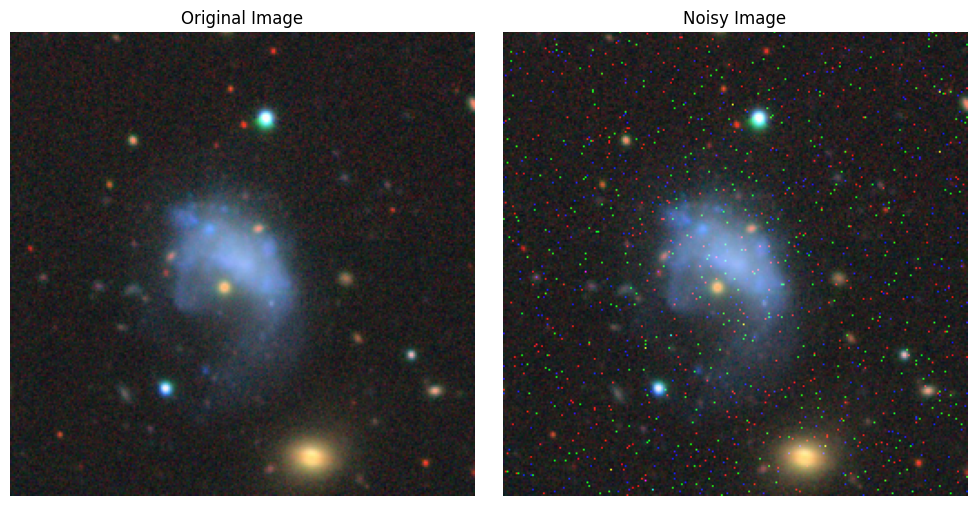

In [ ]:
original_image = cv2.imread('/mnt/e/Work/SEM 7/cv/project/dataset/0/image_30.png')
noisy_image = add_gaussian_noise(original_image)

original_image_rgb = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)
noisy_image_rgb = cv2.cvtColor(noisy_image, cv2.COLOR_BGR2RGB)

# Plotting the images
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.title("Original Image")
plt.imshow(original_image_rgb)
plt.axis('off')  # Hide axes

plt.subplot(1, 2, 2)
plt.title("Noisy Image")
plt.imshow(noisy_image_rgb)
plt.axis('off')  # Hide axes

plt.tight_layout()
plt.show()

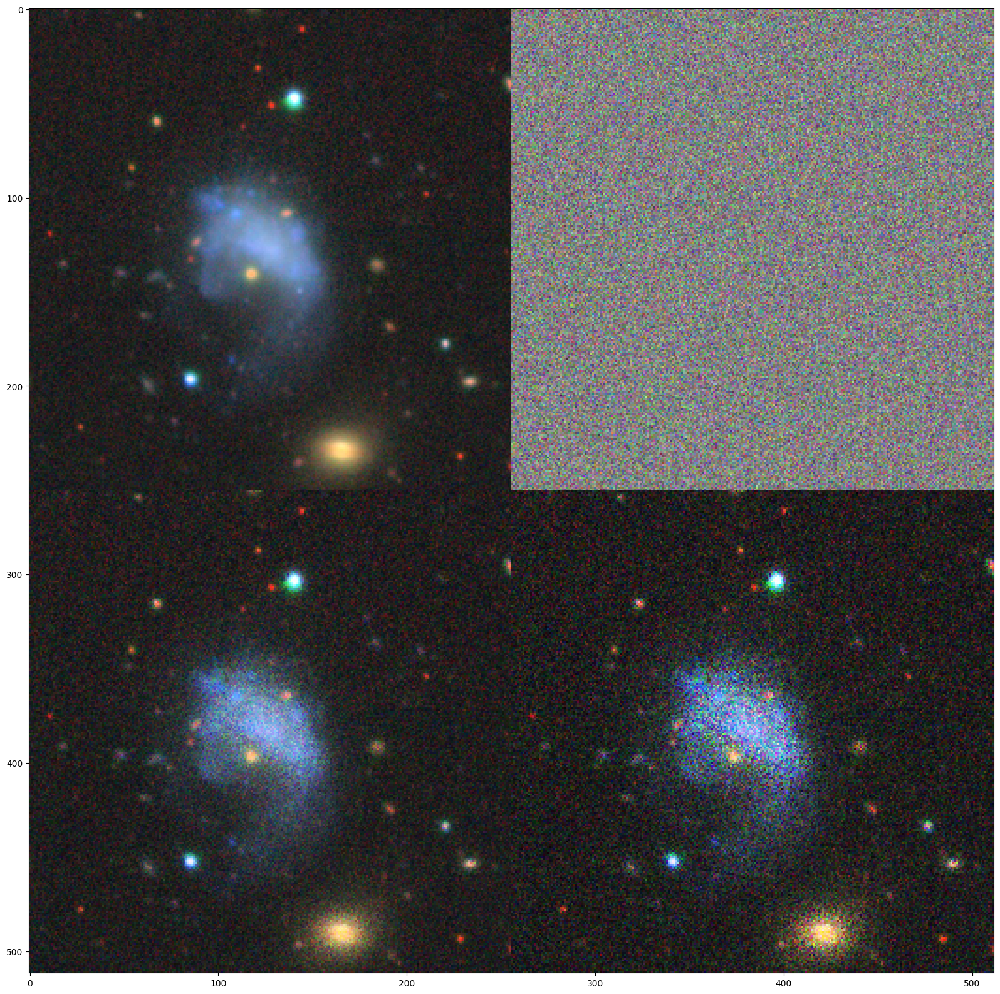

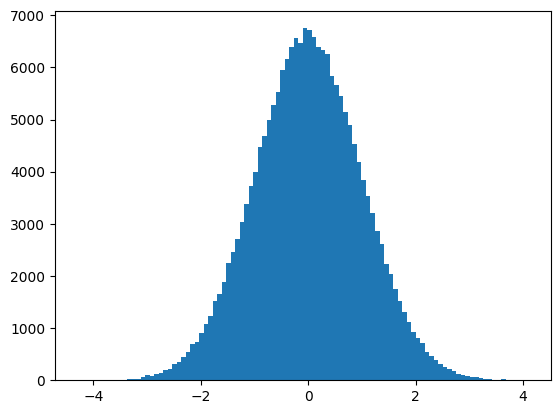

In [ ]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

img = cv2.imread('/mnt/e/Work/SEM 7/cv/project/dataset/0/image_30.png')[...,::-1]/255.0
noise =  np.random.normal(loc=0, scale=1, size=img.shape)

noisy = np.clip((img + noise*0.2),0,1)
noisy2 = np.clip((img + noise*0.4),0,1)

noisy2mul = np.clip((img*(1 + noise*0.2)),0,1)
noisy4mul = np.clip((img*(1 + noise*0.4)),0,1)

noisy2mul = np.clip((img*(1 + noise*0.2)),0,1)
noisy4mul = np.clip((img*(1 + noise*0.4)),0,1)

img2 = img*2
n2 = np.clip(np.where(img2 <= 1, (img2*(1 + noise*0.2)), (1-img2+1)*(1 + noise*0.2)*-1 + 2)/2, 0,1)
n4 = np.clip(np.where(img2 <= 1, (img2*(1 + noise*0.4)), (1-img2+1)*(1 + noise*0.4)*-1 + 2)/2, 0,1)


# norm noise for viz only
noise2 = (noise - noise.min())/(noise.max()-noise.min())
plt.figure(figsize=(20,20))
plt.imshow(np.vstack((np.hstack((img, noise2)),
                      np.hstack((n2, n4)))))
plt.show()
plt.hist(noise.ravel(), bins=100)
plt.show()


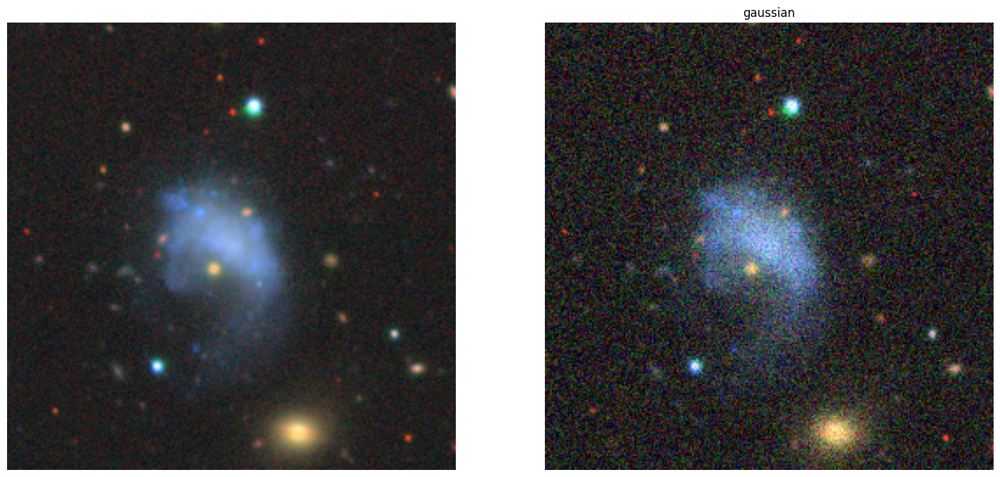

In [27]:
import skimage
import matplotlib.pyplot as plt
img_path="/mnt/e/Work/SEM 7/cv/project/dataset/0/image_30.png"
img = skimage.io.imread(img_path)/255.0

def plotnoise(img, mode, r, c, i):
    plt.subplot(r,c,i)
    if mode is not None:
        gimg = skimage.util.random_noise(img, mode=mode)
        plt.imshow(gimg)
    else:
        plt.imshow(img)
    plt.title(mode)
    plt.axis("off")

plt.figure(figsize=(18,24))
r=1
c=2
plotnoise(img, "gaussian", r,c,2)
#plotnoise(img, "localvar", r,c,2)
#plotnoise(img, "poisson", r,c,2)
#plotnoise(img, "salt", r,c,4)
#plotnoise(img, "pepper", r,c,5)
#plotnoise(img, "s&p", r,c,2)
#plotnoise(img, "speckle", r,c,7)
plotnoise(img, None, r,c,1)
plt.show()


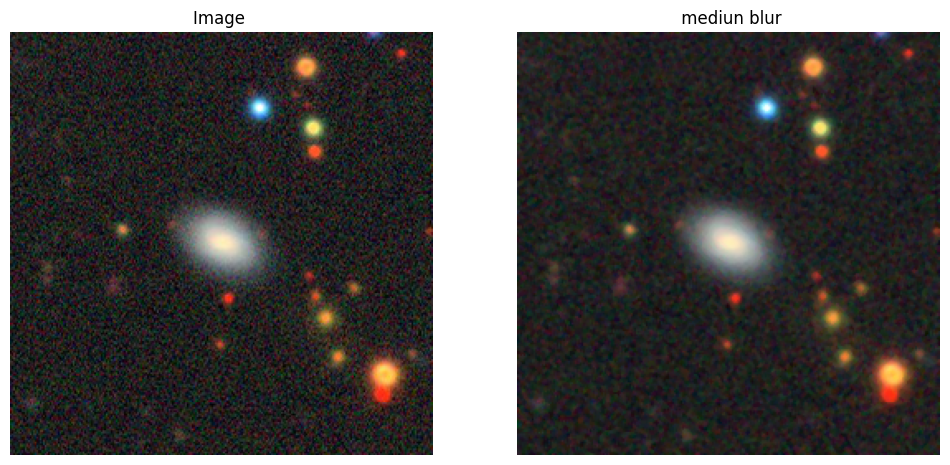

In [17]:
image = cv2.imread('dataset/3/image_5625.png', cv2.IMREAD_COLOR)

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)



denoised_image = cv2.medianBlur(image, 3)  
plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Image ')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(denoised_image)
plt.title(' mediun blur')
plt.axis('off')

plt.show()


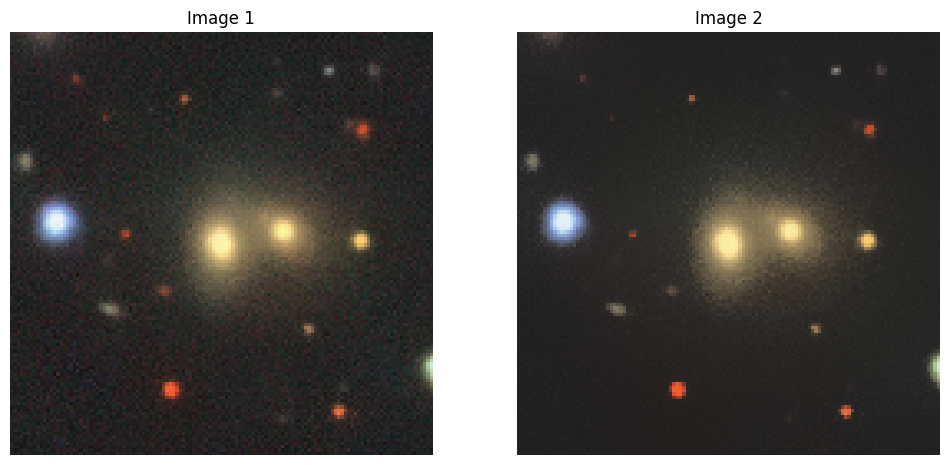

In [3]:
import cv2
from matplotlib import pyplot as plt

image = cv2.imread('/home/vamsi/cv/project/neww/Image-Super-Resolution-via-Iterative-Refinement/experiments/1/new/1out/image_1088.png', cv2.IMREAD_COLOR)

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

smoothed_image = cv2.bilateralFilter(image, d=40, sigmaColor=30, sigmaSpace=200) 

plt.figure(figsize=(12, 6))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title('Image 1')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(smoothed_image)
plt.title('Image 2')
plt.axis('off')

plt.show()


In [2]:
plt.savefig('/home/vamsi/cv/project/neww/Image-Super-Resolution-via-Iterative-Refinement/k.png')


<Figure size 640x480 with 0 Axes>

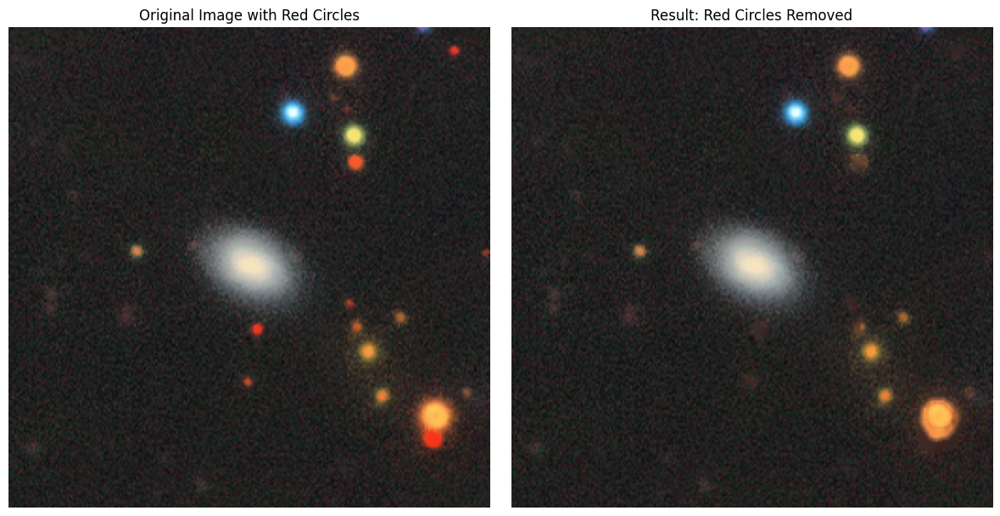

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

img = cv2.imread('dc/3/image_5625.png', cv2.IMREAD_COLOR)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib

hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

lower_red1 = np.array([0, 120, 70])
upper_red1 = np.array([10, 255, 255])
lower_red2 = np.array([170, 120, 70])
upper_red2 = np.array([180, 255, 255])

mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
mask = cv2.bitwise_or(mask1, mask2)

kernel = np.ones((5, 5), np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

result = cv2.inpaint(img, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)
result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)  # Convert for Matplotlib

# Plot the input and output images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(img_rgb)
axs[0].set_title('Original Image with Red Circles')
axs[0].axis('off')

axs[1].imshow(result_rgb)
axs[1].set_title('Result: Red Circles Removed')
axs[1].axis('off')

plt.tight_layout()
plt.show()


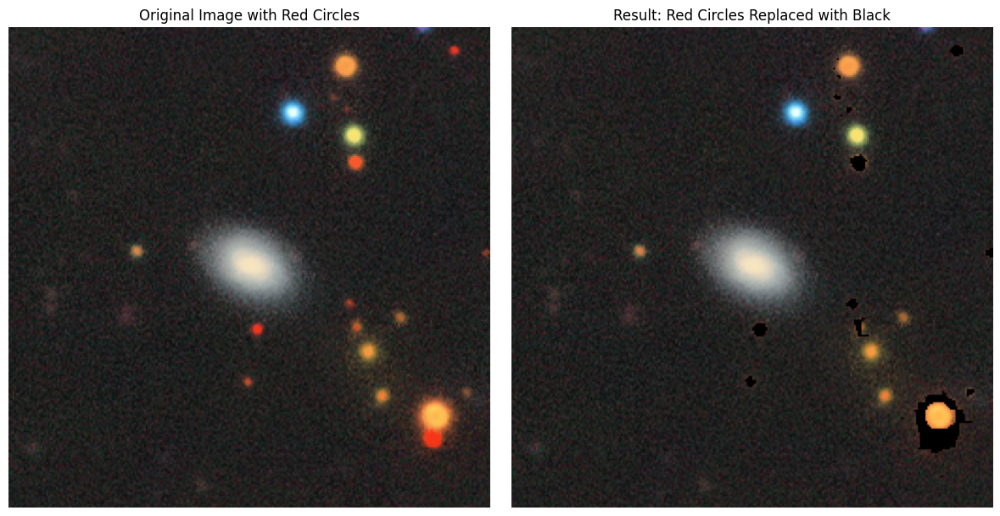

In [29]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Read the image
img = cv2.imread('dc/3/image_5625.png', cv2.IMREAD_COLOR)
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert BGR to RGB for Matplotlib

# Convert to HSV
hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)

# Define range for red color in HSV
lower_red1 = np.array([0, 120, 70])
upper_red1 = np.array([10, 255, 255])
lower_red2 = np.array([170, 120, 70])
upper_red2 = np.array([180, 255, 255])

# Create masks for red color
mask1 = cv2.inRange(hsv, lower_red1, upper_red1)
mask2 = cv2.inRange(hsv, lower_red2, upper_red2)
mask = cv2.bitwise_or(mask1, mask2)

# Optional: Morphological operations to clean the mask
kernel = np.ones((5, 5), np.uint8)
mask = cv2.morphologyEx(mask, cv2.MORPH_CLOSE, kernel)

# Replace red areas with black
result = img.copy()
result[mask > 0] = [0, 0, 0]  # Set red areas to black (BGR format)
result_rgb = cv2.cvtColor(result, cv2.COLOR_BGR2RGB)  # Convert for Matplotlib

# Plot the input and output images
fig, axs = plt.subplots(1, 2, figsize=(12, 6))

axs[0].imshow(img_rgb)
axs[0].set_title('Original Image with Red Circles')
axs[0].axis('off')

axs[1].imshow(result_rgb)
axs[1].set_title('Result: Red Circles Replaced with Black')
axs[1].axis('off')

plt.tight_layout()
plt.show()


In [1]:
import cv2
import os
from pathlib import Path

# Paths for the original and new filtered dataset
original_dataset_path = 'dataset'
new_dataset_path = 'dc'

# Create the new dataset directory if it doesn't exist
Path(new_dataset_path).mkdir(parents=True, exist_ok=True)

# Loop through each subfolder (label) and image in the original dataset
for label_folder in os.listdir(original_dataset_path):
    label_path = os.path.join(original_dataset_path, label_folder)
    new_label_path = os.path.join(new_dataset_path, label_folder)

    # Create label folder in new dataset path if it doesn't exist
    Path(new_label_path).mkdir(parents=True, exist_ok=True)

    # Apply bilateral filter to each image and save
    for image_file in os.listdir(label_path):
        image_path = os.path.join(label_path, image_file)
        image = cv2.imread(image_path)

        if image is not None:
            # Apply bilateral filter
            smoothed_image = cv2.bilateralFilter(image, d=40, sigmaColor=30, sigmaSpace=200)

            # Save the filtered image in the corresponding new folder
            new_image_path = os.path.join(new_label_path, image_file)
            cv2.imwrite(new_image_path, smoothed_image)

print("Filtered dataset created successfully!")


Filtered dataset created successfully!


In [1]:
import cv2
import os
from pathlib import Path

# Paths for the original and new grayscale dataset
original_dataset_path = 'dc'
new_dataset_path = 'dcg'

# Create the new dataset directory if it doesn't exist
Path(new_dataset_path).mkdir(parents=True, exist_ok=True)

# Loop through each subfolder (label) and image in the original dataset
for label_folder in os.listdir(original_dataset_path):
    label_path = os.path.join(original_dataset_path, label_folder)
    new_label_path = os.path.join(new_dataset_path, label_folder)

    # Create label folder in new dataset path if it doesn't exist
    Path(new_label_path).mkdir(parents=True, exist_ok=True)

    # Convert each image to grayscale and save
    for image_file in os.listdir(label_path):
        image_path = os.path.join(label_path, image_file)
        image = cv2.imread(image_path)

        if image is not None:
            # Convert to grayscale
            grayscale_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

            # Save the grayscale image in the corresponding new folder
            new_image_path = os.path.join(new_label_path, image_file)
            cv2.imwrite(new_image_path, grayscale_image)

print("Grayscale dataset created successfully!")


Grayscale dataset created successfully!


In [ ]:
import os
import cv2
from tqdm import tqdm

input_dir = 'dataset'
output_dir = 'dg64'

os.makedirs(output_dir, exist_ok=True)

# Loop through each class subfolder
for class_name in os.listdir(input_dir):
    class_input_path = os.path.join(input_dir, class_name)
    class_output_path = os.path.join(output_dir, class_name)
    
    # Create class folder in output directory
    os.makedirs(class_output_path, exist_ok=True)
    
    # Process each image in the class folder
    for img_name in tqdm(os.listdir(class_input_path), desc=f'Processing {class_name}'):
        img_input_path = os.path.join(class_input_path, img_name)
        img_output_path = os.path.join(class_output_path, img_name)
        
        # Read, resize, and convert to grayscale
        img = cv2.imread(img_input_path)
        img_resized = cv2.resize(img, (64, 64))
        img_gray = cv2.cvtColor(img_resized, cv2.COLOR_BGR2GRAY)
        
        # Save the grayscale image
        cv2.imwrite(img_output_path, img_gray)


Processing 7: 100%|██████████| 2628/2628 [00:06<00:00, 414.76it/s]


In [68]:
import os
import cv2
import numpy as np

# Path to query image and folder
query_img_path = '/home/vamsi/cv/project/dc/5/image_9977.png'
folder_path = '/home/vamsi/cv/project/dataset_bilateral/new_128'

# Read query image
query_img = cv2.imread(query_img_path, cv2.IMREAD_COLOR)

# Function to compare images
def compare_images(img1, img2):
    return np.array_equal(img1, img2)

# Find matching image
for file_name in os.listdir(folder_path):
    img_path = os.path.join(folder_path, file_name)
    folder_img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    
    if folder_img is not None and compare_images(query_img, folder_img):
        print(f'Matching image found: {file_name}')
        break
else:
    print('No matching image found.')


No matching image found.


In [ ]:
import os
import cv2
from skimage.metrics import structural_similarity as ssim


query_img = cv2.imread(query_img_path, cv2.IMREAD_COLOR)
query_img = cv2.resize(query_img, (64, 64))

def calculate_ssim(img1, img2):
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    score, _ = ssim(gray1, gray2, full=True)
    return score

max_ssim = -1
most_similar_image = None

for file_name in os.listdir(folder_path):
    img_path = os.path.join(folder_path, file_name)
    folder_img = cv2.imread(img_path, cv2.IMREAD_COLOR)
    if folder_img is not None:
        folder_img = cv2.resize(folder_img, (64, 64))
        score = calculate_ssim(query_img, folder_img)
        if score > max_ssim:
            max_ssim = score
            most_similar_image = file_name

print(f'Most similar image: {most_similar_image} with SSIM: {max_ssim:.4f}')


Most similar image: new_3_image_6555.png with SSIM: 0.9488


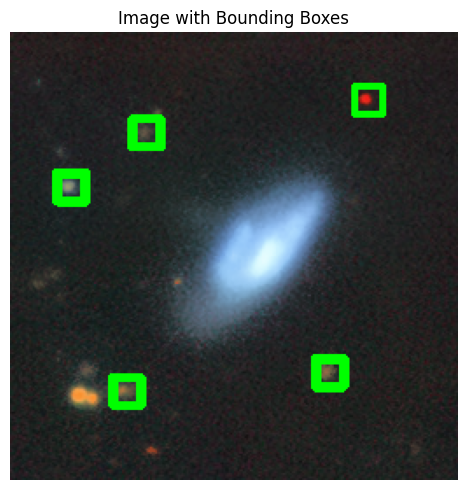

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

main_image = cv2.imread('/home/vamsi/cv/image_1079.png')
template = cv2.imread('/home/vamsi/cv/project/blue.png')

gray_main = cv2.cvtColor(main_image, cv2.COLOR_BGR2GRAY)
gray_template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

# Template matching
result = cv2.matchTemplate(gray_main, gray_template, cv2.TM_CCOEFF_NORMED)

threshold = 0.8  # Adjust as needed
locations = np.where(result >= threshold)

# Draw bounding boxes on the main image
for pt in zip(*locations[::-1]):
    h, w = gray_template.shape[:2]
    cv2.rectangle(main_image, pt, (pt[0] + w, pt[1] + h), (0, 255, 0), 2)  # Green bounding box

# Convert the image to RGB for displaying with matplotlib
main_image_rgb = cv2.cvtColor(main_image, cv2.COLOR_BGR2RGB)

# Plot the image with bounding boxes
plt.figure(figsize=(10, 5))
plt.imshow(main_image_rgb)
plt.title("Image with Bounding Boxes")
plt.axis("off")
plt.tight_layout()
plt.show()


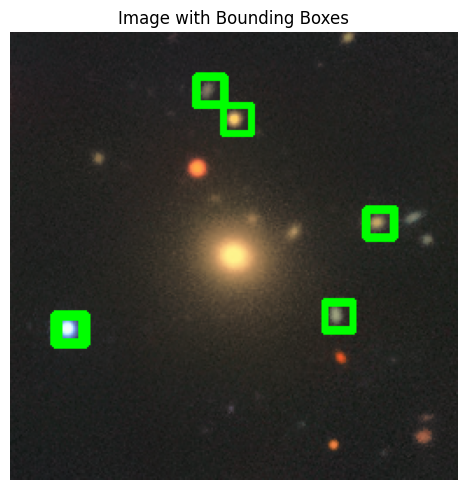

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the main image and the template
main_image = cv2.imread('/home/vamsi/cv/project/dc/2/image_2939.png')
template = cv2.imread('/home/vamsi/cv/project/blue.png')

# Template matching in RGB
result = cv2.matchTemplate(main_image, template, cv2.TM_CCOEFF_NORMED)

# Set a threshold for matching
threshold = 0.8  # Adjust as needed
locations = np.where(result >= threshold)

for pt in zip(*locations[::-1]):
    h, w = template.shape[:2]
    cv2.rectangle(main_image, pt, (pt[0] + w, pt[1] + h), (0, 255, 0), 2)  # Green bounding box

main_image_rgb = cv2.cvtColor(main_image, cv2.COLOR_BGR2RGB)

# Plot the image with bounding boxes
plt.figure(figsize=(10, 5))
plt.imshow(main_image_rgb)
plt.title("Image with Bounding Boxes")
plt.axis("off")
plt.tight_layout()
plt.show()


# important #

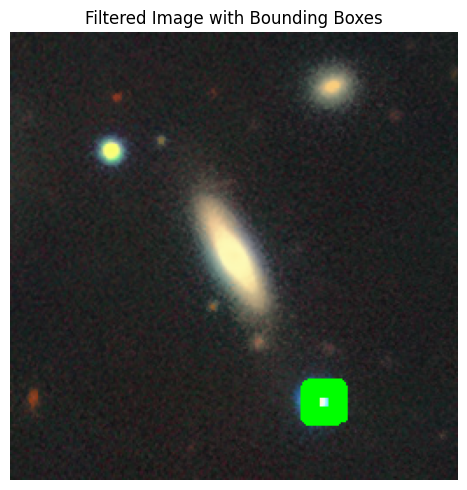

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the main image and the template
main_image = cv2.imread('/home/vamsi/cv/project/dc/4/image_7717.png')
template = cv2.imread('/home/vamsi/cv/project/blue.png')

# Template matching in RGB
result = cv2.matchTemplate(main_image, template, cv2.TM_CCOEFF_NORMED)

threshold = 0.5  
locations = np.where(result >= threshold)

h, w, _ = template.shape

output_image = main_image.copy()

for pt in zip(*locations[::-1]):
    roi = main_image[pt[1]:pt[1] + h, pt[0]:pt[0] + w]

    mean_color = cv2.mean(roi)[:3] 

    if mean_color[0] > 1.1*mean_color[1] and mean_color[0] > 1.2 *mean_color[2]:  # Blue > Green and Red
        cv2.rectangle(output_image, pt, (pt[0] + w, pt[1] + h), (0, 255, 0), 2)  # Green bounding box

output_image_rgb = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)

# Plot the final image with bounding boxes
plt.figure(figsize=(10, 5))
plt.imshow(output_image_rgb)
plt.title("Filtered Image with Bounding Boxes")
plt.axis("off")
plt.tight_layout()
plt.show()


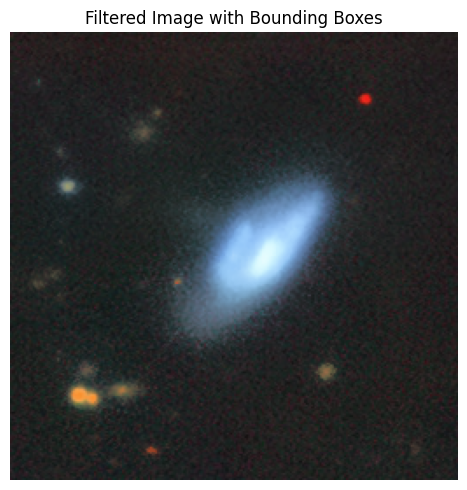

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

main_image = cv2.imread('/home/vamsi/cv/image_1079.png')
template = cv2.imread('/home/vamsi/cv/project/blue.png')
result = cv2.matchTemplate(main_image, template, cv2.TM_CCOEFF_NORMED)

threshold = 0.8  
locations = np.where(result >= threshold)

h, w, _ = template.shape

output_image = main_image.copy()

for pt in zip(*locations[::-1]):
    roi = main_image[pt[1]:pt[1] + h, pt[0]:pt[0] + w]

    mean_color = cv2.mean(roi)[:3]  # (B, G, R)

    if mean_color[0] > 1.1*mean_color[1] and mean_color[0] > 1.2 *mean_color[2]:  # Blue > Green and Red
        cv2.rectangle(output_image, pt, (pt[0] + w, pt[1] + h), (0, 255, 0), 2)  # Green bounding box

output_image_rgb = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 5))
plt.imshow(output_image_rgb)
plt.title("Filtered Image with Bounding Boxes")
plt.axis("off")
plt.tight_layout()
plt.show()


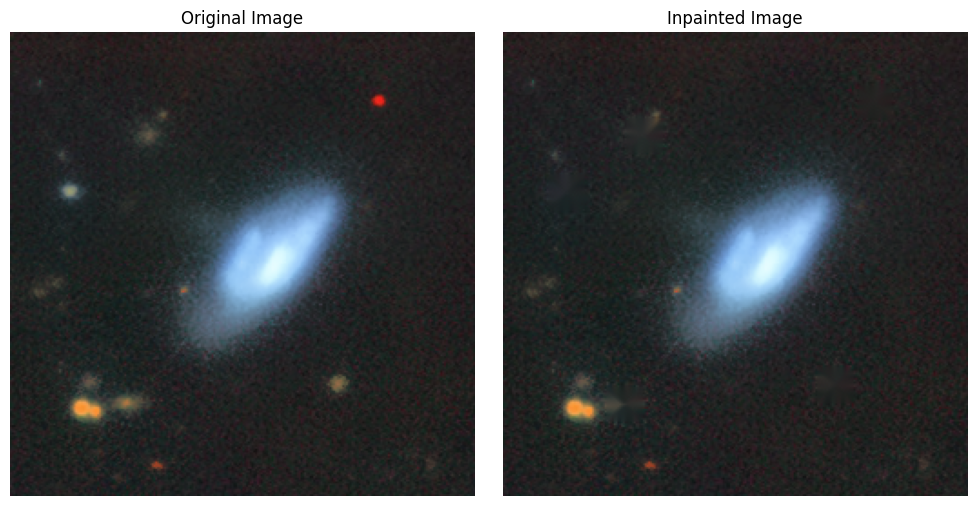

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


main_image = cv2.imread('/home/vamsi/cv/image_1079.png')
template = cv2.imread('/home/vamsi/cv/project/blue.png')
gray_main = cv2.cvtColor(main_image, cv2.COLOR_BGR2GRAY)
gray_template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

result = cv2.matchTemplate(gray_main, gray_template, cv2.TM_CCOEFF_NORMED)

threshold = 0.8  # Adjust as needed
locations = np.where(result >= threshold)

mask = np.zeros_like(gray_main, dtype=np.uint8)
for pt in zip(*locations[::-1]):
    h, w = gray_template.shape[:2]
    cv2.rectangle(mask, pt, (pt[0] + w, pt[1] + h), 255, -1)

inpainted_image = cv2.inpaint(main_image, mask, inpaintRadius=2, flags=cv2.INPAINT_TELEA)

main_image_rgb = cv2.cvtColor(main_image, cv2.COLOR_BGR2RGB)
inpainted_image_rgb = cv2.cvtColor(inpainted_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(main_image_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(inpainted_image_rgb)
plt.title("Inpainted Image")
plt.axis("off")

plt.tight_layout()
plt.show()

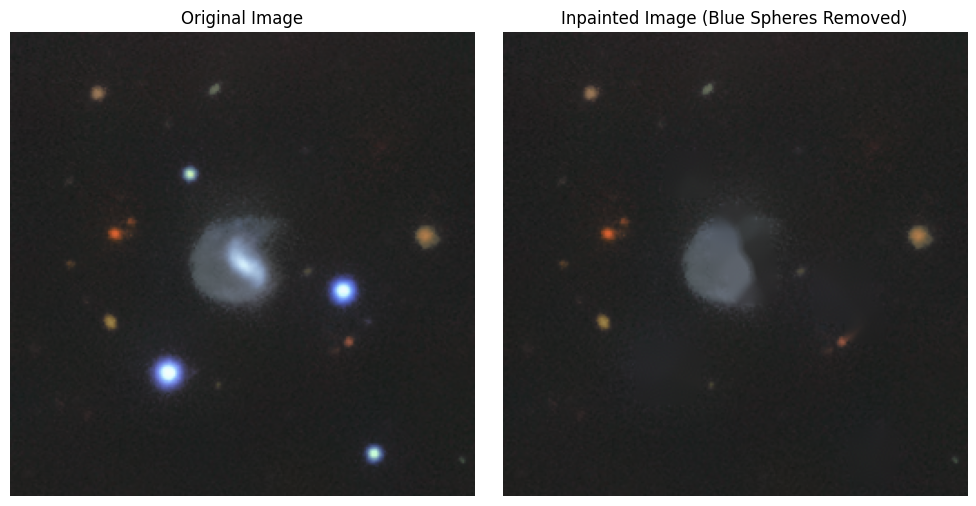

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt


hsv_main = cv2.cvtColor(main_image, cv2.COLOR_BGR2HSV)

main_image = cv2.imread('/home/vamsi/cv/image_3.png')
template = cv2.imread('/home/vamsi/cv/project/blue.png')

lower_blue = np.array([100, 50, 50])  
upper_blue = np.array([140, 255, 255])

blue_mask = cv2.inRange(hsv_main, lower_blue, upper_blue)

gray_main = cv2.cvtColor(main_image, cv2.COLOR_BGR2GRAY)
filtered_main = cv2.bitwise_and(gray_main, gray_main, mask=blue_mask)

gray_template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

result = cv2.matchTemplate(filtered_main, gray_template, cv2.TM_CCOEFF_NORMED)

threshold = 0.2 
locations = np.where(result >= threshold)

mask = np.zeros_like(gray_main, dtype=np.uint8)
for pt in zip(*locations[::-1]):
    h, w = gray_template.shape[:2]
    cv2.rectangle(mask, pt, (pt[0] + w, pt[1] + h), 255, -1)

inpainted_image = cv2.inpaint(main_image, mask, inpaintRadius=5, flags=cv2.INPAINT_TELEA)

main_image_rgb = cv2.cvtColor(main_image, cv2.COLOR_BGR2RGB)
inpainted_image_rgb = cv2.cvtColor(inpainted_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(main_image_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(inpainted_image_rgb)
plt.title("Inpainted Image (Blue Spheres Removed)")
plt.axis("off")

plt.tight_layout()
plt.show()


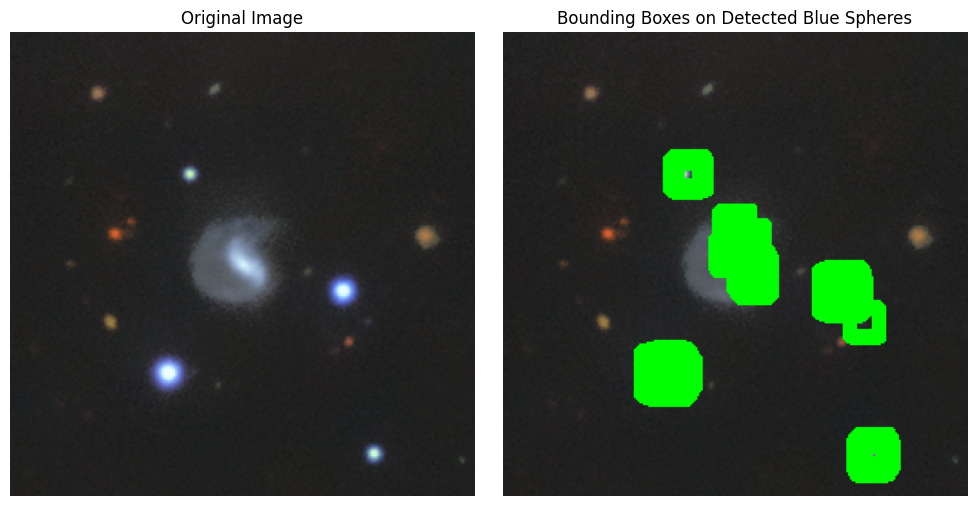

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

main_image = cv2.imread('/home/vamsi/cv/image_3.png')
template = cv2.imread('/home/vamsi/cv/project/blue.png')
hsv_main = cv2.cvtColor(main_image, cv2.COLOR_BGR2HSV)

lower_blue = np.array([100, 50, 50])  
upper_blue = np.array([140, 255, 255])

blue_mask = cv2.inRange(hsv_main, lower_blue, upper_blue)

gray_main = cv2.cvtColor(main_image, cv2.COLOR_BGR2GRAY)
filtered_main = cv2.bitwise_and(gray_main, gray_main, mask=blue_mask)

gray_template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)

result = cv2.matchTemplate(filtered_main, gray_template, cv2.TM_CCOEFF_NORMED)

threshold = 0.2  
locations = np.where(result >= threshold)

main_image_with_boxes = main_image.copy()
for pt in zip(*locations[::-1]):
    h, w = gray_template.shape[:2]
    cv2.rectangle(main_image_with_boxes, pt, (pt[0] + w, pt[1] + h), (0, 255, 0), 2)  # Green bounding box

main_image_rgb = cv2.cvtColor(main_image, cv2.COLOR_BGR2RGB)
main_image_with_boxes_rgb = cv2.cvtColor(main_image_with_boxes, cv2.COLOR_BGR2RGB)

# Plot the original and annotated images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(main_image_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(main_image_with_boxes_rgb)
plt.title("Bounding Boxes on Detected Blue Spheres")
plt.axis("off")

plt.tight_layout()
plt.show()


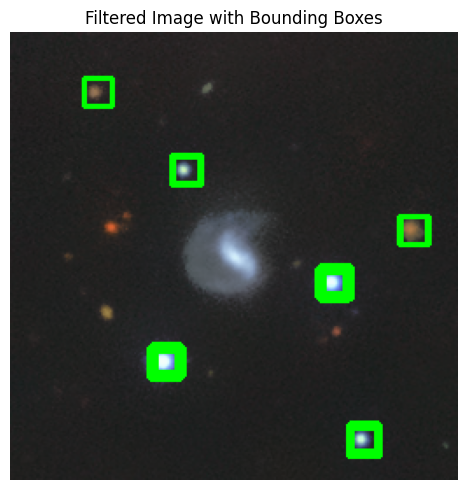

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

main_image = cv2.imread('/home/vamsi/cv/image_3.png')
template = cv2.imread('/home/vamsi/cv/project/blue.png')

result = cv2.matchTemplate(main_image, template, cv2.TM_CCOEFF_NORMED)

threshold = 0.8  # Adjust as needed
locations = np.where(result >= threshold)

h, w, _ = template.shape

output_image = main_image.copy()

for pt in zip(*locations[::-1]):
    roi = main_image[pt[1]:pt[1] + h, pt[0]:pt[0] + w]

    roi_h, roi_w, _ = roi.shape
    
    if 0.9 * w <= roi_w <= 1.2 * w and 0.9 * h <= roi_h <= 1.2 * h:
        
        cv2.rectangle(output_image, pt, (pt[0] + w, pt[1] + h), (0, 255, 0), 2)  # Green bounding box

output_image_rgb = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 5))
plt.imshow(output_image_rgb)
plt.title("Filtered Image with Bounding Boxes")
plt.axis("off")
plt.tight_layout()
plt.show()


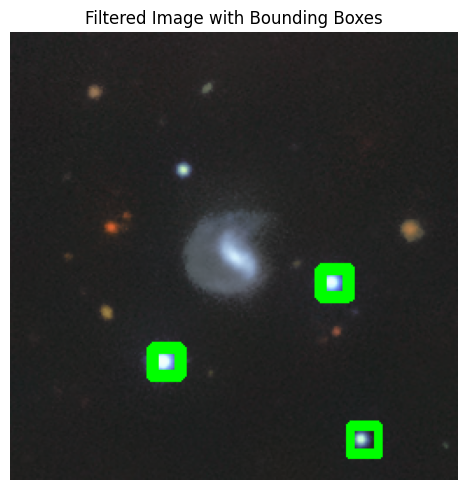

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

main_image = cv2.imread('/home/vamsi/cv/image_3.png')
template = cv2.imread('/home/vamsi/cv/project/blue.png')

result = cv2.matchTemplate(main_image, template, cv2.TM_CCOEFF_NORMED)


threshold = 0.8  
locations = np.where(result >= threshold)

h, w, _ = template.shape

output_image = main_image.copy()

for pt in zip(*locations[::-1]):
    roi = main_image[pt[1]:pt[1] + h, pt[0]:pt[0] + w]

    roi_h, roi_w, _ = roi.shape
    if 0.9 * w <= roi_w <= 1.2 * w and 0.9 * h <= roi_h <= 1.2 * h:
        mean_color = cv2.mean(roi)[:3]  

        if mean_color[0] > 1.1 * mean_color[1] and mean_color[0] > 1.2 * mean_color[2]:  
            cv2.rectangle(output_image, pt, (pt[0] + w, pt[1] + h), (0, 255, 0), 2)  

output_image_rgb = cv2.cvtColor(output_image, cv2.COLOR_BGR2RGB)

plt.figure(figsize=(10, 5))
plt.imshow(output_image_rgb)
plt.title("Filtered Image with Bounding Boxes")
plt.axis("off")
plt.tight_layout()
plt.show()


In [ ]:
import os

output_folder = 'new_set'
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

original_folder = os.path.join(output_folder, 'original_image')
inpainted_folder = os.path.join(output_folder, 'inpainted_image')

if not os.path.exists(original_folder):
    os.makedirs(original_folder)
if not os.path.exists(inpainted_folder):
    os.makedirs(inpainted_folder)

cv2.imwrite(os.path.join(original_folder, 'i21.jpg'), main_image)  
cv2.imwrite(os.path.join(inpainted_folder, 'i21.jpg'), inpainted_image)  

print("Images have been saved in the 'new_set' folder under 'original_image' and 'inpainted_image' subfolders.")


Images have been saved in the 'new_set' folder under 'original_image' and 'inpainted_image' subfolders.


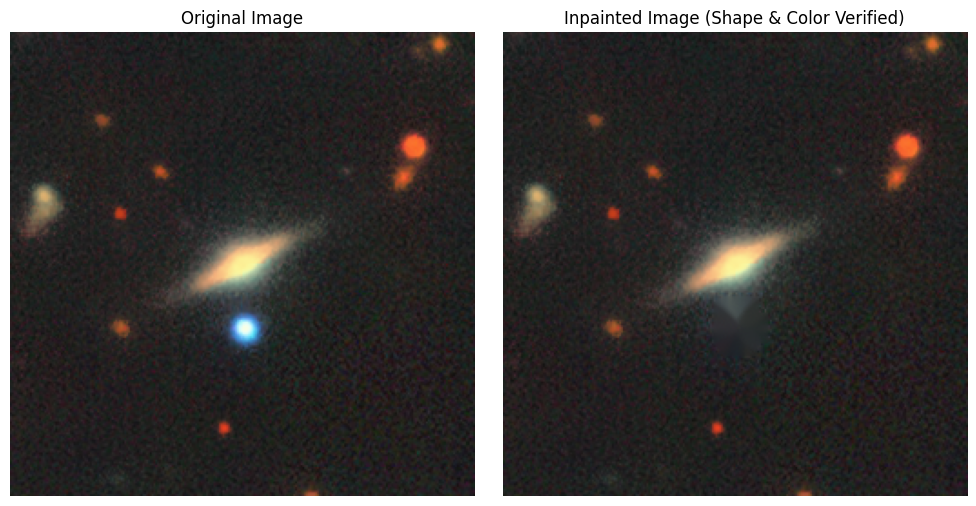

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt



hsv_main = cv2.cvtColor(main_image, cv2.COLOR_BGR2HSV)

lower_blue = np.array([100, 50, 50])
upper_blue = np.array([140, 255, 255])

blue_mask = cv2.inRange(hsv_main, lower_blue, upper_blue)

gray_main = cv2.cvtColor(main_image, cv2.COLOR_BGR2GRAY)
filtered_main = cv2.bitwise_and(gray_main, gray_main, mask=blue_mask)

gray_template = cv2.cvtColor(template, cv2.COLOR_BGR2GRAY)
_, template_thresh = cv2.threshold(gray_template, 50, 255, cv2.THRESH_BINARY)
template_contours, _ = cv2.findContours(template_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

result = cv2.matchTemplate(filtered_main, gray_template, cv2.TM_CCOEFF_NORMED)
threshold = 0.2
locations = np.where(result >= threshold)

mask = np.zeros_like(gray_main, dtype=np.uint8)

for pt in zip(*locations[::-1]):
    h, w = gray_template.shape[:2]
    region = gray_main[pt[1]:pt[1] + h, pt[0]:pt[0] + w]
    _, region_thresh = cv2.threshold(region, 50, 255, cv2.THRESH_BINARY)
    region_contours, _ = cv2.findContours(region_thresh, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    
    if region_contours:
        similarity = cv2.matchShapes(template_contours[0], region_contours[0], cv2.CONTOURS_MATCH_I1, 0)
        if similarity < 0.2:  # Lower value = more similar shape
            cv2.rectangle(mask, pt, (pt[0] + w, pt[1] + h), 255, -1)

inpainted_image = cv2.inpaint(main_image, mask, inpaintRadius=3, flags=cv2.INPAINT_TELEA)

# Convert images to RGB for display
main_image_rgb = cv2.cvtColor(main_image, cv2.COLOR_BGR2RGB)
inpainted_image_rgb = cv2.cvtColor(inpainted_image, cv2.COLOR_BGR2RGB)

# Plot the images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(main_image_rgb)
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(inpainted_image_rgb)
plt.title("Inpainted Image (Shape & Color Verified)")
plt.axis("off")

plt.tight_layout()
plt.show()
